# User Satisfaction Analysis

## Imports

In [76]:
import pickle
import numpy as np
import pandas as pd
import math
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sqlalchemy import create_engine
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
sys.path.append(os.path.abspath(os.path.join('../scripts')))
from df_selector import *
from df_visualizer import *
from df_outlier_handler import OutlierHandler

## Reading Data

In [5]:
user_engagement_df = pd.read_csv("../data/user_engagement_data.csv")
user_engagement_df.head()

,MSISDN/Number,cluster,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
0,33601001722,4,1.0,116720140.0,8.786906e+08
1,33601001754,1,1.0,181230963.0,1.568596e+08
2,33601002511,1,1.0,134969374.0,5.959665e+08
3,33601007832,5,1.0,49878024.0,4.223207e+08
4,33601008617,0,2.0,37104453.0,1.457411e+09


In [6]:
user_experience_df = pd.read_csv("../data/user_experience_data.csv")
user_experience_df.head()

,MSISDN/Number,cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
0,33601001722,1,46.0,76.0,2895381.0
1,33601001754,0,31.0,99.0,7685845.5
2,33601002511,0,59.0,97.0,4150403.0
3,33601007832,1,84.0,248.0,2396.0
4,33601008617,2,119.0,43204.5,8047274.5


## Engagement Score

In [25]:
eng_df = user_engagement_df.set_index('MSISDN/Number')[
    ['xDR Sessions', 'Dur (ms)', 'Total Data Volume (Bytes)']]

In [26]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(eng_df)
scaled_data

array([[-0.54866182, -0.14578281,  0.54827419],
       [-0.54866182,  0.6146225 , -1.28049119],
       [-0.54866182,  0.0693255 , -0.16800992],
       ...,
       [-0.54866182, -1.41773868,  0.13265469],
       [-0.54866182,  0.14027633, -0.46103345],
       [-0.54866182,  1.3675591 , -0.1671958 ]])

In [27]:
normalized_data = normalize(scaled_data)
normalized_data

array([[-0.69518453, -0.1847148 ,  0.69469339],
       [-0.36033465,  0.40365445, -0.84096493],
       [-0.94927152,  0.11994406, -0.29068368],
       ...,
       [-0.35954757, -0.92906865,  0.08693091],
       [-0.75133844,  0.19209465, -0.63134   ],
       [-0.36997482,  0.9221754 , -0.11274383]])

In [28]:
with open("../models/user_engagement.pkl", "rb") as f:
    kmeans1 = pickle.load(f)

In [29]:
less_engaged_cluster = 5

In [30]:
distance = kmeans1.fit_transform(normalized_data)
distance_from_less_engaged_cluster = list(
    map(lambda x: x[less_engaged_cluster], distance))
user_engagement_df['engagement_score'] = distance_from_less_engaged_cluster
user_engagement_df.head()

,MSISDN/Number,cluster,xDR Sessions,Dur (ms),Total Data Volume (Bytes),engagement_score
0,33601001722,4,1.0,116720140.0,8.786906e+08,1.403010
1,33601001754,1,1.0,181230963.0,1.568596e+08,0.963489
2,33601002511,1,1.0,134969374.0,5.959665e+08,0.892019
3,33601007832,5,1.0,49878024.0,4.223207e+08,0.266359
4,33601008617,0,2.0,37104453.0,1.457411e+09,1.685946


## Experience Score

In [31]:
exp_df = user_experience_df.set_index('MSISDN/Number')[
    ['Total Avg RTT (ms)', 'Total Avg Bearer TP (kbps)', 'Total TCP Retrans. Vol (Bytes)']]

In [32]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(exp_df)
scaled_data

array([[-0.6592221 , -0.67835113,  0.07974981],
       [-0.93025698, -0.67723988,  1.48764748],
       [-0.4243252 , -0.67733651,  0.44859557],
       ...,
       [-0.55080815, -0.18123297, -0.70710815],
       [-0.76763605, -0.67641851, -0.6983095 ],
       [-0.40625621, -0.6804287 , -0.73574801]])

In [33]:
normalized_data = normalize(scaled_data)
normalized_data

array([[-0.69445913, -0.71461066,  0.08401263],
       [-0.49462677, -0.36009509,  0.79099677],
       [-0.46295619, -0.7390019 ,  0.48943616],
       ...,
       [-0.60233164, -0.1981858 , -0.77325221],
       [-0.61969779, -0.54605963, -0.5637318 ],
       [-0.37568797, -0.62923071, -0.68038758]])

In [34]:
with open("../models/user_experience.pkl", "rb") as f:
    kmeans2 = pickle.load(f)

In [35]:
worst_experience_cluster = 1

In [36]:
distance = kmeans2.fit_transform(normalized_data)
distance_from_worst_experience_cluster = list(
    map(lambda x: x[worst_experience_cluster], distance))
user_experience_df['experience_score'] = distance_from_worst_experience_cluster
user_experience_df.head()

,MSISDN/Number,cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score
0,33601001722,1,46.0,76.0,2895381.0,0.746953
1,33601001754,0,31.0,99.0,7685845.5,1.358754
2,33601002511,0,59.0,97.0,4150403.0,1.073841
3,33601007832,1,84.0,248.0,2396.0,0.468067
4,33601008617,2,119.0,43204.5,8047274.5,1.829289


## Satisfaction Score

In [38]:
user_engagement_df.rename(columns={'cluster': 'engagement_cluster'}, inplace=True)
user_engagement_df.head()

,MSISDN/Number,engagement_cluster,xDR Sessions,Dur (ms),Total Data Volume (Bytes),engagement_score
0,33601001722,4,1.0,116720140.0,8.786906e+08,1.403010
1,33601001754,1,1.0,181230963.0,1.568596e+08,0.963489
2,33601002511,1,1.0,134969374.0,5.959665e+08,0.892019
3,33601007832,5,1.0,49878024.0,4.223207e+08,0.266359
4,33601008617,0,2.0,37104453.0,1.457411e+09,1.685946


In [39]:
user_experience_df.rename(columns={'cluster': 'experience_cluster'}, inplace=True)
user_experience_df.head()

,MSISDN/Number,experience_cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score
0,33601001722,1,46.0,76.0,2895381.0,0.746953
1,33601001754,0,31.0,99.0,7685845.5,1.358754
2,33601002511,0,59.0,97.0,4150403.0,1.073841
3,33601007832,1,84.0,248.0,2396.0,0.468067
4,33601008617,2,119.0,43204.5,8047274.5,1.829289


In [45]:
user_satisfaction_df = pd.merge(user_engagement_df, user_experience_df, on='MSISDN/Number')
user_satisfaction_df['satisfaction_score'] = (
    user_satisfaction_df['engagement_score'] + user_satisfaction_df['experience_score'])/2
user_satisfaction_df.head()

,MSISDN/Number,engagement_cluster,xDR Sessions,Dur (ms),Total Data Volume (Bytes),engagement_score,experience_cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score,satisfaction_score
0,33601001722,4,1.0,116720140.0,8.786906e+08,1.403010,1,46.0,76.0,2895381.0,0.746953,1.074981
1,33601001754,1,1.0,181230963.0,1.568596e+08,0.963489,0,31.0,99.0,7685845.5,1.358754,1.161121
2,33601002511,1,1.0,134969374.0,5.959665e+08,0.892019,0,59.0,97.0,4150403.0,1.073841,0.982930
3,33601007832,5,1.0,49878024.0,4.223207e+08,0.266359,1,84.0,248.0,2396.0,0.468067,0.367213
4,33601008617,0,2.0,37104453.0,1.457411e+09,1.685946,2,119.0,43204.5,8047274.5,1.829289,1.757618


In [46]:
user_satisfaction_df = user_satisfaction_df[['MSISDN/Number', 'engagement_score',
                        'experience_score', 'satisfaction_score']]
user_satisfaction_df.set_index('MSISDN/Number', inplace=True)
user_satisfaction_df.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33601001722,1.403010,0.746953,1.074981
33601001754,0.963489,1.358754,1.161121
33601002511,0.892019,1.073841,0.982930
33601007832,0.266359,0.468067,0.367213
33601008617,1.685946,1.829289,1.757618


In [47]:
top10_satisfied = user_satisfaction_df.sort_values('satisfaction_score', ascending=False).head(10)
top10_satisfied

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33664097605,1.950662,1.834034,1.892348
33668555063,1.950218,1.834145,1.892181
33668495500,1.950119,1.834041,1.892080
33642929430,1.950723,1.831857,1.891290
33666189829,1.951270,1.830170,1.890720
33695664219,1.951390,1.829973,1.890681
33658128094,1.946530,1.834831,1.890681
33658642971,1.946352,1.834520,1.890436
33683909674,1.950388,1.830473,1.890430


## Linear Regression for satisfaction score prediction

In [48]:
# splitting training and testing data
X = user_satisfaction_df[['engagement_score', 'experience_score']]
y = user_satisfaction_df[['satisfaction_score']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [49]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [50]:
y_pred = model.predict(X_test)

In [57]:
print(f'Intercept: {model.intercept_}')
print(f'Coefficients: { model.coef_}')
print(f"Mean squared error: {np.mean((y_pred - y_test.values) ** 2)}")

Intercept: [0.]
Coefficients: [[0.5 0.5]]
Mean squared error: 1.5406162524364805e-31


## Outliers

In [58]:
df = user_satisfaction_df.copy(deep=True)
df.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33601001722,1.403010,0.746953,1.074981
33601001754,0.963489,1.358754,1.161121
33601002511,0.892019,1.073841,0.982930
33601007832,0.266359,0.468067,0.367213
33601008617,1.685946,1.829289,1.757618


In [59]:
df = df[['engagement_score', 'experience_score']]
df.head()

,engagement_score,experience_score
MSISDN/Number,,
33601001722,1.403010,0.746953
33601001754,0.963489,1.358754
33601002511,0.892019,1.073841
33601007832,0.266359,0.468067
33601008617,1.685946,1.829289


In [60]:
outlier_handler = OutlierHandler(df)

In [63]:
outlier_handler.getOverview(['engagement_score', 'experience_score'])

Name of columns,engagement_score,experience_score
Min,0.047974,0.165154
Q1,0.428515,0.351718
Median,0.994004,1.058597
Q3,1.637958,1.518825
Max,1.952069,1.834846
IQR,1.209444,1.167107
Lower fence,-1.385651,-1.398943
Upper fence,3.452124,3.269485
Skew,0.094769,-0.041448
Number_of_outliers,0,0


<AxesSubplot:>

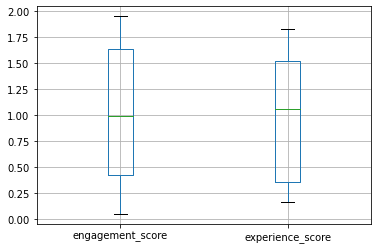

In [61]:
df.boxplot()

## K-means Clusturing

In [64]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)
scaled_data

array([[ 0.5994889 , -0.40868015],
       [-0.10770044,  0.63900368],
       [-0.22269429,  0.15110285],
       ...,
       [-0.3141756 , -0.92860453],
       [-0.39584571, -1.25088221],
       [ 0.83982264, -1.38341179]])

In [65]:
normalized_data = normalize(scaled_data)
normalized_data

array([[ 0.8262673 , -0.56327822],
       [-0.16620021,  0.98609203],
       [-0.82749499,  0.5614731 ],
       ...,
       [-0.32048514, -0.94725354],
       [-0.30170675, -0.95340077],
       [ 0.5189303 , -0.85481656]])

In [66]:
kmeans = KMeans(n_clusters=2, random_state=1).fit(normalized_data)
kmeans.labels_

array([0, 1, 1, ..., 0, 0, 0], dtype=int32)

In [67]:
user_satisfaction_df.insert(0, 'satisfaction_cluster', kmeans.labels_)
user_satisfaction_df

,satisfaction_cluster,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,,
33601001722,0,1.403010,0.746953,1.074981
33601001754,1,0.963489,1.358754,1.161121
33601002511,1,0.892019,1.073841,0.982930
33601007832,0,0.266359,0.468067,0.367213
33601008617,1,1.685946,1.829289,1.757618
...,...,...,...,...
33789967113,0,0.844397,0.167004,0.505701
33789980299,1,1.949615,1.815006,1.882310
33789996170,0,0.835163,0.443340,0.639252


In [69]:
user_satisfaction_df['satisfaction_cluster'].value_counts()

1    55037
0    50679
Name: satisfaction_cluster, dtype: int64

In [70]:
fig = px.scatter(user_satisfaction_df, x='engagement_score', y='experience_score',
                 color='satisfaction_cluster', size='satisfaction_score')
fig.show()

In [74]:
# average satisfaction & experience score per cluster
user_satisfaction_df.groupby('satisfaction_cluster').agg(
    {'satisfaction_score': 'mean', 'experience_score': 'mean'})

,satisfaction_score,experience_score
satisfaction_cluster,,
0,0.649420,0.435268
1,1.338214,1.492362


## Export dataframe to mysql

In [89]:
engine = create_engine('mysql+pymysql://root:@localhost/tellco')

In [90]:
# writing to database
try:
    print('writing to the database')
    frame = user_satisfaction_df.to_sql(
        "telco_analysis_score", con=engine, if_exists='replace')
except Exception as e:
  print("Error writing to database: ", e)

writing to the database


In [91]:
# reading from database
pd.read_sql("select * from tellco.telco_analysis_score", engine)

,MSISDN/Number,satisfaction_cluster,engagement_score,experience_score,satisfaction_score
0,33601001722,0,1.403010,0.746953,1.074981
1,33601001754,1,0.963489,1.358754,1.161121
2,33601002511,1,0.892019,1.073841,0.982930
3,33601007832,0,0.266359,0.468067,0.367213
4,33601008617,1,1.685946,1.829289,1.757618
...,...,...,...,...,...
105711,33789967113,0,0.844397,0.167004,0.505701
105712,33789980299,1,1.949615,1.815006,1.882310
105713,33789996170,0,0.835163,0.443340,0.639252
105714,33789997247,0,0.784405,0.255144,0.519775


## Saving Data

In [93]:
# save the dataframe
user_satisfaction_df.to_csv('../data/user_satisfaction_data.csv')